# Serial Autoencoder Training: Control (Constant Environment)

This is the control counterpart to the serial training notebook. It runs the same procedure (architecture, number of training phases, epochs, and hyperparameters) but holds the environment constant across all three phases. Where the experimental notebook trains across three distinct mazes (Tmaze_0, Tmaze_1, Tmaze_2), this version trains across three variants of a single maze (Tmaze_v0a, Tmaze_v0b, Tmaze_v0c), so the model sees essentially the same environment three times in a row.

The purpose is to isolate the effect of the environmental change. Because the control matches the experimental run in every respect except that the environment stays the same, any difference in the resulting latent representations (reconstruction, SSCP structure, place fields, or orientation tuning) can be attributed to the environmental transition rather than to the amount of training or repeated exposure alone. Outputs are written under Control- prefixed model and plot folders, so they stay separate from the experimental results.

The hippocampal autoencoder, training loop, checkpointing, and analysis pipeline are identical to the experimental notebook, so see that notebook's header for the per cell details. The control flags behave the same way:

1. `model_training`: train from scratch when True, or load an existing checkpoint when False.
2. `save_plots`: write figures to the experiment's plot folder.
3. `batch_training`: at the end, repeat the full constant environment training over many experiments (replicates) to gather statistics.

### Import libraries

In [2]:
%matplotlib inline
import os
import sys
import pathlib
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt

### Import Autoencoder class

In [4]:
folder_path = str(pathlib.Path().resolve().parents[1])
print("Folder path =", folder_path)
sys.path.append(folder_path + '/Notebooks/Spatial_AE/')

from model import *
from data import *
from dataloaders import *
from training import *
from analysis import *
from plotting import *

Folder path = C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps


### Check GPU 

In [6]:
print("CUDA is available =", torch.cuda.is_available())
print("CUDA device count =", torch.cuda.device_count())
if torch.cuda.device_count() > 1:
    os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
print("CUDA device name =", torch.cuda.get_device_name(0))

CUDA is available = True
CUDA device count = 2
CUDA device name = NVIDIA RTX A5000


### Hyperparameters

In [8]:
#Experiment
model_training = False
save_plots = False

#Model
n_hidden = 200
batch_size = 256
num_epochs = 100
learning_rate = 1e-4
C_factor = 1e3
alpha = 1e5

#Others
trial_t = 0

peak_as_centroid=True
min_pix_cluster=0.02
max_pix_cluster=0.5
active_threshold=0.2

### Dataset variables

In [10]:
envs = ['Tmaze_v0a', 'Tmaze_v0b', 'Tmaze_v0c']
env = envs[0] #Choose environment index
data_path, csv_filename, num_images = format_dataset(folder_path, env)

print("Dataset Environment =", env)
print("Num. Images in Dataset =", num_images)
print("Dataset Path =", data_path)
print("CSV path =    ", csv_filename)

Dataset Environment = Tmaze_v0a
Num. Images in Dataset = 39998
Dataset Path = C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Datasets/Tmaze_v0a
CSV path =     C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Datasets/Tmaze_v0a/data.csv


### Model name

In [12]:
foldername = 'Control-Exp1-NEpisodes' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate)

model_folder_path = folder_path + '/Models/Experiment1/'
plot_folder_path = folder_path + '/Plots/Experiment1/'

check_model_folders(model_folder_path, foldername)
check_plot_folders(plot_folder_path, foldername)

model_folder_path = model_folder_path + foldername
plot_folder_path = plot_folder_path + foldername

loss_csv_filename = model_folder_path + '/loss_history.csv'

print("Model path =", model_folder_path)
print("Plot path  =", plot_folder_path)
print("Loss path  =", loss_csv_filename)

Model path = C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Models/Control-Exp1-NEpisodes100-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001
Plot path  = C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Plots/Control-Exp1-NEpisodes100-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001
Loss path  = C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Models/Control-Exp1-NEpisodes100-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001/loss_history.csv


### Import image dataset and CSV data

In [14]:
dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)
Tmaze0_data, Tmaze0_position, Tmaze0_orientation = load_csv(csv_filename, num_images)

print("Dataset Environment =", env)
print("Dataset Shape =", dataset.shape)
print("Position Shape =", Tmaze0_position.shape)
print()
Tmaze0_data

Dataset Environment = Tmaze_v0a
Dataset Shape = (39998, 120, 160, 3)
Position Shape = (39998, 2)



,Trial_number,Trial_time,Frame_ID,Embedding,action,retrieved_action,X,Y,Z,Internal_states,RewardID,Reward_value,n_replays
0,0,1.024,1,[],"[0, 0]",False,-0.000008,-0.509500,270.045416,"[0.499, 0.999]",0,"[0, 0, 0, 0]",0
1,0,2.048,2,[],"[-0.79, 0.79]",False,-0.004842,-0.508203,300.623175,"[0.498, 0.998]",0,"[0, 0, 0, 0]",0
2,0,3.072,3,[],"[6.28, 4.71]",False,0.031163,-0.405354,271.754423,"[0.497, 0.997]",0,"[0, 0, 0, 0]",0
3,0,4.096,4,[],"[6.28, 6.28]",False,0.035498,-0.280885,272.135320,"[0.496, 0.996]",0,"[0, 0, 0, 0]",0
4,0,5.120,5,[],"[-0.79, 0.79]",False,0.030488,-0.279377,303.759316,"[0.495, 0.995]",0,"[0, 0, 0, 0]",0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
39993,75,180.224,39996,[],"[3.14, 1.57]",False,-0.155667,0.587166,162.917025,"[0.824, 0.324]",0,"[0, 0, 0, 0]",0
39994,75,181.248,39997,[],"[6.28, 5.5]",False,-0.266212,0.536343,145.677952,"[0.823, 0.323]",0,"[0, 0, 0, 0]",0
39995,75,182.272,39998,[],"[6.28, 6.28]",False,-0.369154,0.466171,145.791293,"[0.822, 0.322]",0,"[0, 0, 0, 0]",0
39996,75,183.296,39999,[],"[6.28, 6.28]",False,-0.472141,0.396160,145.791718,"[0.821, 0.321]",0,"[0, 0, 0, 0]",0


### Display example image

Image shape = (120, 160, 3)


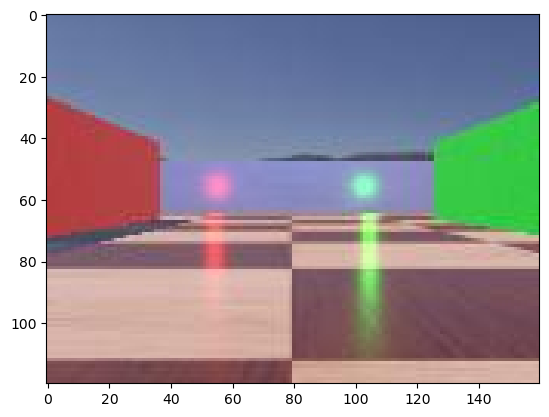

In [16]:
idx = 0
plt.imshow(dataset[idx])
print("Image shape =", dataset[idx].shape)

### Model training

In [18]:
if model_training == True:
    loss = []
    model = Conv_AE(n_hidden=n_hidden)
    train_loader = create_dataloader(dataset, batch_size=batch_size)

    #Save untrained model
    trial_t = 0
    model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
    model_path = model_folder_path + '/' + model_filename
    torch.save(model.state_dict(), model_path)
    
    for i in range(num_epochs):
        #Train model
        history, _ = train_autoencoder(model, train_loader, num_epochs=1, learning_rate=learning_rate, alpha=alpha, C_factor=C_factor)
        loss.append(history[0])

        #Save model
        trial_t = i + 1
        model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
        model_path = model_folder_path + '/' + model_filename
        torch.save(model.state_dict(), model_path)

## Update dataset to next environment

In [20]:
env = envs[1]
data_path, csv_filename, num_images = format_dataset(folder_path, env)
dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)

Tmaze1_data, Tmaze1_position, Tmaze1_orientation = load_csv(csv_filename, num_images)

print("New Environment =", env)
print("Num. Images in Dataset =", num_images)
print("Dataset Shape =", dataset.shape)
print("Position Shape =", Tmaze1_position.shape)
print()

New Environment = Tmaze_v0b
Num. Images in Dataset = 39998
Dataset Shape = (39998, 120, 160, 3)
Position Shape = (39998, 2)



#### Display example image

Image shape = (120, 160, 3)


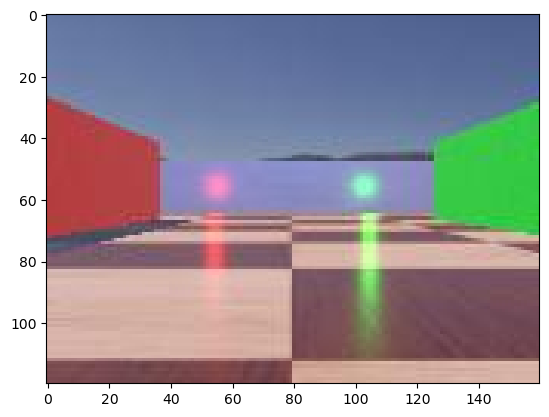

In [22]:
plt.imshow(dataset[idx])
print("Image shape =", dataset[idx].shape)

#### Model training

In [24]:
if model_training == True:
    train_loader = create_dataloader(dataset, batch_size=batch_size)
    for i in range(num_epochs):
        #Train model
        history, _ = train_autoencoder(model, train_loader, num_epochs=1, learning_rate=learning_rate, alpha=alpha, C_factor=C_factor)
        loss.append(history[0])

        #Save model
        trial_t = i + 1
        model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
        model_path = model_folder_path + '/' + model_filename
        torch.save(model.state_dict(), model_path)

## Update dataset to next environment

In [26]:
env = envs[2]
data_path, csv_filename, num_images = format_dataset(folder_path, env)
dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)

Tmaze2_data, Tmaze2_position, Tmaze2_orientation = load_csv(csv_filename, num_images)

print("New Environment =", env)
print("Num. Images in Dataset =", num_images)
print("Dataset Shape =", dataset.shape)
print("Position Shape =", Tmaze2_position.shape)
print()

New Environment = Tmaze_v0c
Num. Images in Dataset = 39998
Dataset Shape = (39998, 120, 160, 3)
Position Shape = (39998, 2)



#### Display example image

Image shape = (120, 160, 3)


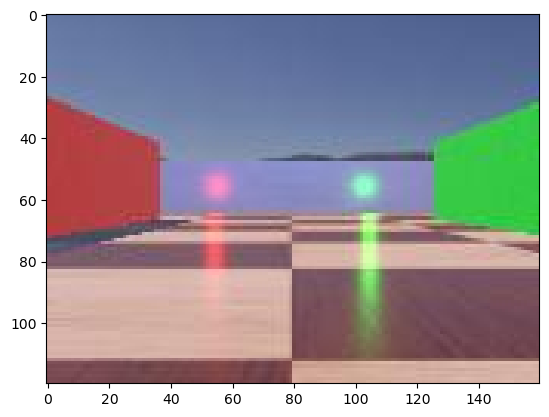

In [28]:
plt.imshow(dataset[idx])
print("Image shape =", dataset[idx].shape)

#### Model training

In [30]:
if model_training == True:
    train_loader = create_dataloader(dataset, batch_size=batch_size)
    for i in range(num_epochs):
        #Train model
        history, _ = train_autoencoder(model, train_loader, num_epochs=1, learning_rate=learning_rate, alpha=alpha, C_factor=C_factor)
        loss.append(history[0])

        #Save model
        trial_t = i + 1
        model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
        model_path = model_folder_path + '/' + model_filename
        torch.save(model.state_dict(), model_path)

    save_training_loss(loss_csv_filename, loss)

In [31]:
if model_training == True:
    fig = plt.figure(figsize=(6,4))
    plt.plot(loss)
    plt.xlabel('epoch')
    plt.ylabel('loss')
    sb.despine()
    plt.suptitle('Loss history', fontsize=15)
    plt.title('Final loss = ' + str(round(loss[-1], 5)), fontsize=10)
    plt.show()
    if save_plots == True:
        fig.savefig(plot_folder_path + '/History_loss.pdf', format='pdf', bbox_inches='tight')
        fig.savefig(plot_folder_path + '/History_loss.png', format='png')

In [41]:
if model_training == False:
    env = envs[2]
    data_path, csv_filename, num_images = format_dataset(folder_path, env)
    dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)
    
    model_filename =  env + '-Trial' + str(100) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
    model_path = model_folder_path + '/' + model_filename
    
    model = Conv_AE(n_hidden=n_hidden)
    model.load_state_dict(torch.load(model_path))
    print("Model loaded:", model_path)

Model loaded: C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Models/Control-Exp1-NEpisodes100-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001/Tmaze_v0c-Trial100of100-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001.pth


## Check Results (Last training episode)

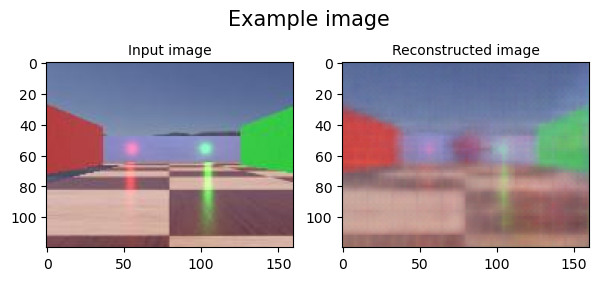

In [42]:
fig = plt.figure(figsize=(7,3))
plt.subplot(121)
plt.imshow(dataset[idx])
plt.suptitle('Example image', fontsize=15)
plt.title('Input image', fontsize=10)
plt.subplot(122)
plt.imshow(predict(dataset[idx], model))
plt.title('Reconstructed image', fontsize=10)

plt.show()
if save_plots == True:
    fig.savefig(plot_folder_path + '/Image_reconstruction.pdf', format='pdf', bbox_inches='tight')
    fig.savefig(plot_folder_path + '/Image_reconstruction.png', format='png')

In [43]:
embeddings = get_latent_vectors(dataset, model, batch_size=batch_size)

In [44]:
all_ratemaps = ratemaps(embeddings, Tmaze2_position, n_bins=50, filter_width=3)

In [45]:
plot_ratemaps(all_ratemaps[:100], plot_folder_path, save=save_plots)

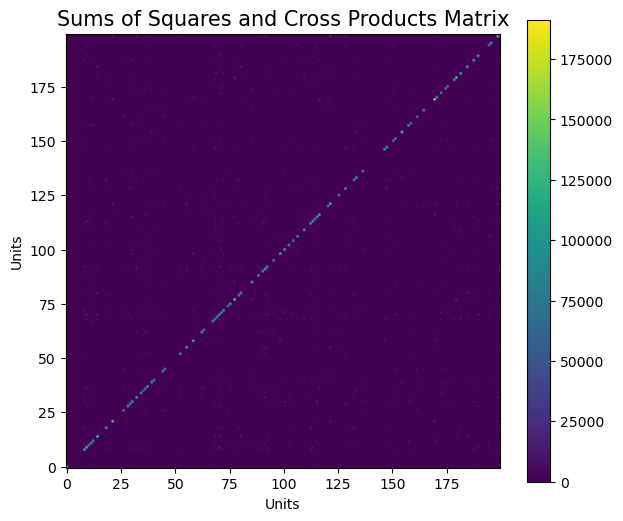

In [46]:
sscp = np.dot(embeddings.T, embeddings)

fig = plt.figure(figsize=(7,6))
plt.title('Sums of Squares and Cross Products Matrix', fontsize=15)
plt.imshow(sscp, origin='lower')
plt.xlabel('Units')
plt.ylabel('Units')
plt.colorbar()
plt.show()
if save_plots == True:
    fig.savefig(plot_folder_path + '/sscp.pdf', format='pdf', bbox_inches='tight')
    fig.savefig(plot_folder_path + '/sscp.png', format='png')

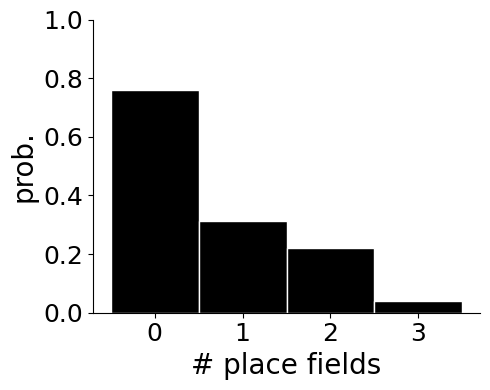

In [47]:
all_num_fields, centroids, sizes = stats_place_fields(all_ratemaps, peak_as_centroid=peak_as_centroid, min_pix_cluster=min_pix_cluster, max_pix_cluster=max_pix_cluster, active_threshold=active_threshold)
centroids_per_field, sizes_per_field = format_centroids(all_num_fields, centroids, sizes)
plot_place_field_hist(all_num_fields, plot_folder_path, save=save_plots)

## Check Results

In [49]:
save_plots = False

### Dataset and Model loading

In [51]:
env_idx = 0
env = envs[env_idx]
trial = 100

envs[env_idx]
data_path, csv_filename, num_images = format_dataset(folder_path, env)
dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)

model_filename =  env + '-Trial' + str(trial) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
model_path = model_folder_path + '/' + model_filename

model = Conv_AE(n_hidden=n_hidden)
model.load_state_dict(torch.load(model_path))
print("Model loaded:", model_path)

loss = load_loss_history(model_folder_path)

Model loaded: C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Models/Control-Exp1-NEpisodes100-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001/Tmaze_v0a-Trial100of100-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001.pth


### Reconstruction performance

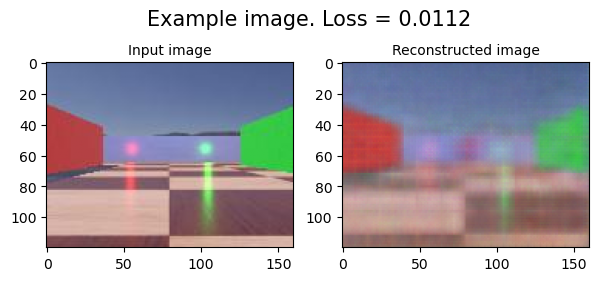

In [53]:
img_indx = 0
loss_idx = (env_idx*num_epochs) + trial
loss[loss_idx]

fig = plt.figure(figsize=(7,3))
plt.subplot(121)
plt.imshow(dataset[img_indx])
plt.suptitle('Example image. Loss = ' + str(round(loss[loss_idx],4)), fontsize=15)
plt.title('Input image', fontsize=10)
plt.subplot(122)
plt.imshow(predict(dataset[img_indx], model))
plt.title('Reconstructed image', fontsize=10)

plt.show()
if save_plots == True:
    fig.savefig(plot_folder_path + '/Image_reconstruction.pdf', format='pdf', bbox_inches='tight')
    fig.savefig(plot_folder_path + '/Image_reconstruction.png', format='png')

### Firing fields

In [55]:
embeddings = get_latent_vectors(dataset, model, batch_size=batch_size)

In [56]:
positions = [Tmaze0_position, Tmaze1_position, Tmaze2_position]
position = positions[env_idx]
all_ratemaps = ratemaps(embeddings, position, n_bins=50, filter_width=3)

In [57]:
plot_ratemaps(all_ratemaps[:100], plot_folder_path, save=save_plots)

### SSCP Matrix

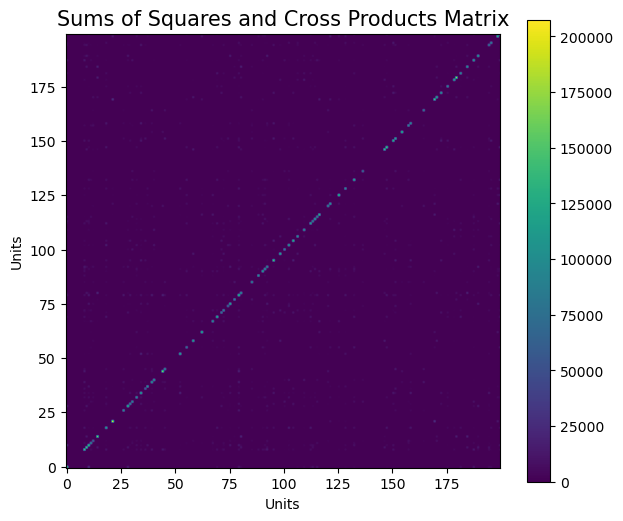

In [59]:
sscp = np.dot(embeddings.T, embeddings)

fig = plt.figure(figsize=(7,6))
plt.title('Sums of Squares and Cross Products Matrix', fontsize=15)
plt.imshow(sscp, origin='lower')
plt.xlabel('Units')
plt.ylabel('Units')
plt.colorbar()
plt.show()
if save_plots == True:
    fig.savefig(plot_folder_path + '/sscp.pdf', format='pdf', bbox_inches='tight')
    fig.savefig(plot_folder_path + '/sscp.png', format='png')

In [60]:
all_num_fields, centroids, sizes = stats_place_fields(all_ratemaps, peak_as_centroid=peak_as_centroid, min_pix_cluster=min_pix_cluster, max_pix_cluster=max_pix_cluster, active_threshold=active_threshold)
centroids_per_field, sizes_per_field = format_centroids(all_num_fields, centroids, sizes)

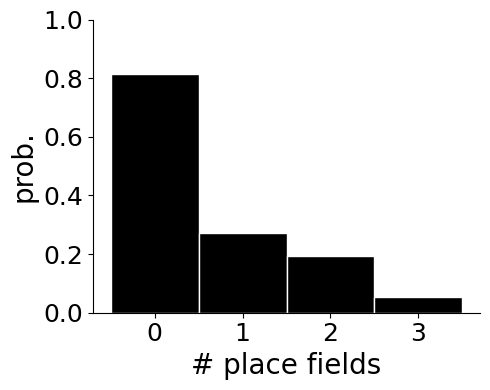

In [61]:
plot_place_field_hist(all_num_fields, plot_folder_path, save=save_plots)

Number of place fields = 0
Size of place fields = [[0, 0]]
YX position of place fields = [[0, 0]]


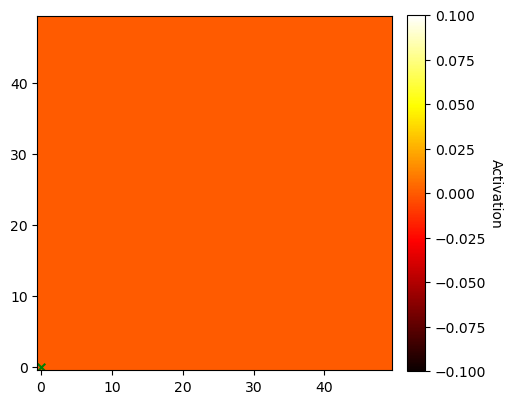

In [62]:
unit = 3
plot_single_ratemap_density(all_ratemaps, unit, all_num_fields, sizes_per_field, centroids_per_field, plot_folder_path, figsize=(5,5), save=save_plots)

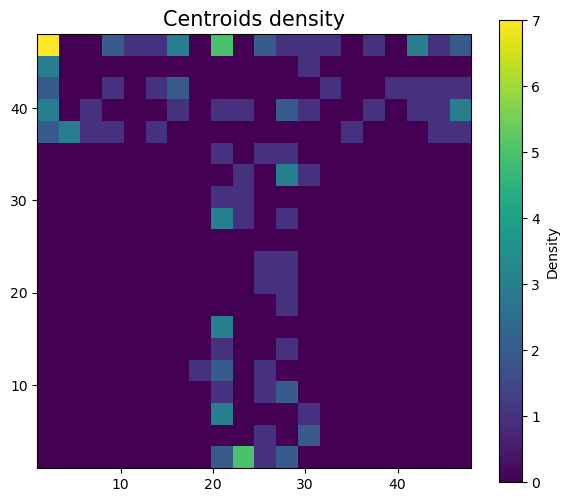

In [63]:
heatmap, xedges, yedges = np.histogram2d(centroids[:,1], centroids[:,0], bins=(20, 20))
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

fig = plt.figure(figsize=(7,6))
plt.imshow(heatmap.T, extent=extent, origin='lower', cmap='viridis')
plt.colorbar(label='Density')
plt.title('Centroids density', fontsize=15)
if save_plots:
    fig.savefig(plot_folder_path + '/Centroids_density.pdf', format='pdf', bbox_inches='tight')
    fig.savefig(plot_folder_path + '/Centroids_density.png', format='png')
plt.show()

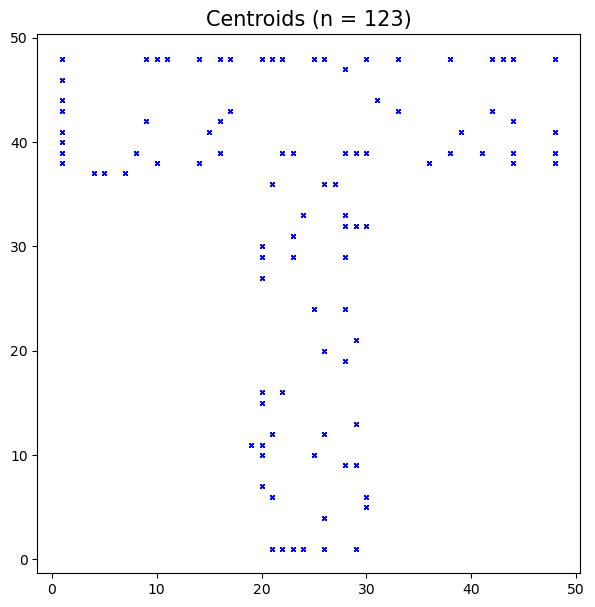

In [64]:
fig = plt.figure(figsize=(7,7))
for i in range(len(centroids)):
    plt.plot(centroids[:,1], centroids[:,0], 'bx', markersize=3)
plt.title("Centroids (n = " + str(len(centroids)) + ")", fontsize=15)
if save_plots:
    fig.savefig(plot_folder_path + '/Centroids.pdf', format='pdf', bbox_inches='tight')
    fig.savefig(plot_folder_path + '/Centroids.png', format='png')
plt.show()

In [65]:
max_fields = np.max(all_num_fields)

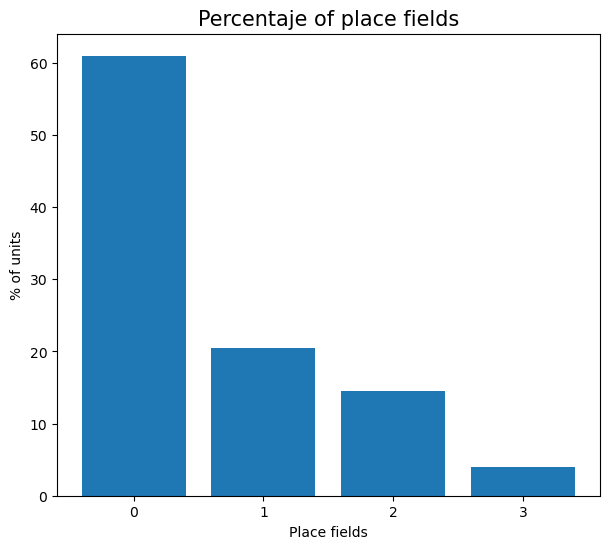

In [66]:
zero_pf = (np.unique(all_num_fields, return_counts=True)[1][0] / n_hidden) * 100
one_pf = (np.unique(all_num_fields, return_counts=True)[1][1] / n_hidden) * 100
two_pf = (np.unique(all_num_fields, return_counts=True)[1][2] / n_hidden) * 100
three_pf = (np.unique(all_num_fields, return_counts=True)[1][3] / n_hidden) * 100

categories = ['0', '1', '2', '3'] #
values = [zero_pf, one_pf, two_pf, three_pf] #

fig = plt.figure(figsize=(7,6))
plt.bar(categories, values)
plt.title('Percentaje of place fields', fontsize=15)
plt.xlabel('Place fields')
plt.ylabel('% of units')
if save_plots:
    fig.savefig(plot_folder_path + '/place_field_histogram.pdf', format='pdf', bbox_inches='tight')
    fig.savefig(plot_folder_path + '/place_field_histogram.png', format='png')
plt.show()

In [67]:
polarmaps = polarmaps(embeddings, Tmaze2_orientation)
plot_polarmaps(polarmaps, plot_folder_path, save=save_plots)

# Batch training

In [82]:
batch_training = True

In [88]:
if batch_training == True:
    num_epochs = 100
    starting_experiment = 1
    total_experiments = 20
    current_exp = starting_experiment
    
    envs = ['Tmaze_v0a', 'Tmaze_v0b', 'Tmaze_v0c']
    
    while current_exp <= total_experiments:
        model_folder_path = folder_path + '/Models/Experiment1/'
        print()
        print('---------- ---------- ---------- ---------- ----------')
        print('STARTING EXPERIMENT', str(current_exp))
        
        env = envs[0]
        data_path, csv_filename, num_images = format_dataset(folder_path, env)
        foldername = 'Control-Exp' + str(current_exp) + '-NEpisodes' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate)
    
        check_model_folders(model_folder_path, foldername)
    
        model_folder_path = model_folder_path + foldername
        loss_csv_filename = model_folder_path + '/loss_history.csv'
    
    
        ################# TRAINING PHASE 1 #################
        dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)
        Tmaze0_data, Tmaze0_position, Tmaze0_orientation = load_csv(csv_filename, num_images)
    
        loss = []
        model = Conv_AE(n_hidden=n_hidden)
        train_loader = create_dataloader(dataset, batch_size=batch_size)
        
        trial_t = 0
        model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
        model_path = model_folder_path + '/' + model_filename
        torch.save(model.state_dict(), model_path)
    
        for i in range(num_epochs):
            #Train model
            history, _ = train_autoencoder(model, train_loader, num_epochs=1, learning_rate=learning_rate, alpha=alpha, C_factor=C_factor)
            loss.append(history[0])
    
            #Save model
            trial_t = i + 1
            model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
            model_path = model_folder_path + '/' + model_filename
            torch.save(model.state_dict(), model_path)
    
    
        ################# TRAINING PHASE 2 #################
        env = envs[1]
        data_path, csv_filename, num_images = format_dataset(folder_path, env)
        dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)
        
        Tmaze1_data, Tmaze1_position, Tmaze1_orientation = load_csv(csv_filename, num_images)
        train_loader = create_dataloader(dataset, batch_size=batch_size)
        
        for i in range(num_epochs):
            history, _ = train_autoencoder(model, train_loader, num_epochs=1, learning_rate=learning_rate, alpha=alpha, C_factor=C_factor)
            loss.append(history[0])
    
            trial_t = i + 1
            model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
            model_path = model_folder_path + '/' + model_filename
            torch.save(model.state_dict(), model_path)
    
        
        ################# TRAINING PHASE 3 #################
        env = envs[2]
        data_path, csv_filename, num_images = format_dataset(folder_path, env)
        dataset = load_dataset(data_path)  # this array should have shape (n_samples, 3, 120, 160)
        
        Tmaze2_data, Tmaze2_position, Tmaze2_orientation = load_csv(csv_filename, num_images)
        train_loader = create_dataloader(dataset, batch_size=batch_size)
        
        for i in range(num_epochs):
            history, _ = train_autoencoder(model, train_loader, num_epochs=1, learning_rate=learning_rate, alpha=alpha, C_factor=C_factor)
            loss.append(history[0])
    
            trial_t = i + 1
            model_filename =  env + '-Trial' + str(trial_t) + 'of' + str(num_epochs) + '-NHidden' + str(n_hidden) + '-BSize' + str(batch_size) + '-C' + str(C_factor) + '-A' + str(alpha) + '-LR' + str(learning_rate) + '.pth'
            model_path = model_folder_path + '/' + model_filename
            torch.save(model.state_dict(), model_path)
    
        save_training_loss(loss_csv_filename, loss)
        current_exp += 1


---------- ---------- ---------- ---------- ----------
STARTING EXPERIMENT 1


Epoch 1/1, Loss: 0.0177: 100%|███████████████████████████████████████████████████████| 157/157 [00:12<00:00, 12.24it/s]


Loss History saved at C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Models/Control-Exp1-NEpisodes3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001/loss_history.csv

---------- ---------- ---------- ---------- ----------
STARTING EXPERIMENT 2


Epoch 1/1, Loss: 0.0162: 100%|███████████████████████████████████████████████████████| 157/157 [00:13<00:00, 11.92it/s]


Loss History saved at C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Models/Control-Exp2-NEpisodes3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001/loss_history.csv

---------- ---------- ---------- ---------- ----------
STARTING EXPERIMENT 3
Creating new model folder = Control-Exp3-NEpisodes3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001


Epoch 1/1, Loss: 0.0155: 100%|███████████████████████████████████████████████████████| 157/157 [00:12<00:00, 12.30it/s]

Loss History saved at C:\Users\specs\Desktop\Robotology\Repos\RORcogmaps/Models/Control-Exp3-NEpisodes3-NHidden200-BSize256-C1000.0-A100000.0-LR0.0001/loss_history.csv
